**Predicción de diabetes en mujeres**
=====================================

Jose Martin
----------

- <a href='#1'>1. Cargar bibliotecas y leer los datos</a>  

    - <a href='#1.1'>1.1. Cargar bibliotecas</a> 
    - <a href='#1.2'>1.2. Leer los datos</a> 
    
- <a href='#2'>2. Visión general</a> 

    - <a href='#2.1'>2.1. Cabezal (Head)</a> 
    - <a href='#2.2'>2.2. Objetivo (Target)</a> 
    - <a href='#2.3'>2.3. Valores faltantes</a> 
    
- <a href='#3'>3. Reemplazar valores faltantes y EDA (Análisis Exploratorio de Datos)</a>

    - <a href='#3.1'>3.1. Insulina</a> 
    - <a href='#3.2'>3.2. Glucosa</a> 
    - <a href='#3.3'>3.3. Espesor de Piel (SkinThickness)</a>
    - <a href='#3.4'>3.4. Presión Arterial (BloodPressure)</a>
    - <a href='#3.5'>3.5. IMC (BMI)</a>
    
- <a href='#4'>4. Nuevas características y EDA</a>

- <a href='#5'>5. Preparar conjunto de datos</a> 
    - <a href='#5.1'>5.1. StandardScaler y LabelEncoder</a> 
    - <a href='#5.2'>5.2. Matriz de Correlación</a>
    - <a href='#5.3'>5.3. X e Y</a>
    - <a href='#5.4'>5.4. Rendimiento del modelo</a>
	- <a href='#5.5'>5.5. Tabla de Puntuaciones</a>
    
- <a href='#6'>6. Aprendizaje Automático</a> 

    - <a href='#6.1'>6.1. Búsqueda Aleatoria + LightGBM - Precisión = 89.8%</a> 
    - <a href='#6.2'>6.2. LightGBM - Umbral de Discriminación</a>
    - <a href='#6.3'>6.3. Búsqueda en Grid + LightGBM y KNN - Precisión = 90.6%</a>
    - <a href='#6.4'>6.4. LightGBM y KNN - Umbral de Discriminación</a>

¡Hola a todos!

Esto es un resumen de todo lo que se ha realizado:

* Completar valores faltantes (la parte más importante)
* Análisis exploratorio de datos
* Creación de nuevas características (para aumentar la precisión)
* Codificación de características
* Uso de LightGBM y optimización de hiperparámetros
* Añadiendo un KNN a LightGBM para superar el 90% de precisión (clasificador de votación)

# <a id='1'>1. Cargar bibliotecas y leer los datos</a> 

## <a id='1.1'>1.1. Cargar bibliotecas</a> 

Cargando bibliotecas

In [1]:
# Python libraries
# Classic,data manipulation and linear algebra
import pandas as pd
import numpy as np
from numpy import interp

# Plots
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.offline as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.tools as tls
import plotly.figure_factory as ff
py.init_notebook_mode(connected=True)
import squarify

# Data processing, metrics and modeling
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import GridSearchCV, cross_val_score, train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import precision_score, recall_score, confusion_matrix,  roc_curve, precision_recall_curve, accuracy_score, roc_auc_score
import lightgbm as lgbm
from sklearn.ensemble import VotingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_curve,auc
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import train_test_split
from yellowbrick.classifier import DiscriminationThreshold

# Stats
import scipy.stats as ss
from scipy.interpolate import interp1d
from scipy.stats import randint as sp_randint
from scipy.stats import uniform as sp_uniform

# Time
from contextlib import contextmanager
@contextmanager
def timer(title):
    t0 = time.time()
    yield
    print("{} - done in {:.0f}s".format(title, time.time() - t0))

#ignore warning messages 
import warnings
warnings.filterwarnings('ignore') 

## <a id='1.2'>1.2. Leer los datos</a> 

Cargando el conjunto de datos con pandas (pd)

In [2]:
data = pd.read_csv('diabetes.csv')

# <a id='2'>2. Visión general</a> 

## <a id='2.1'>2.1. Cabezal (Head)</a> 

Verificando el encabezado (head) y la información (info) de los datos

In [3]:
display(data.info(),data.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


None

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


Los conjuntos de datos constan de varias variables predictoras médicas (independientes) y una variable objetivo (dependiente), el Resultado. Las variables independientes incluyen el número de embarazos que ha tenido la paciente, su IMC, nivel de insulina, edad, etc.

# ¿Qué es la diabetes? 
Según el NIH, "**Diabetes** es una enfermedad que ocurre cuando tu glucosa en sangre, también llamada azúcar en la sangre, es demasiado alta. La glucosa en sangre es tu principal fuente de energía y proviene de los alimentos que consumes. La insulina, una hormona producida por el páncreas, ayuda a que la glucosa de los alimentos entre en tus células para ser utilizada como energía. A veces, tu cuerpo no produce suficiente insulina, ninguna insulina, o no utiliza bien la insulina. Entonces, la glucosa permanece en tu sangre y no llega a tus células.

Con el tiempo, tener demasiada glucosa en la sangre puede causar problemas de salud. Aunque la diabetes no tiene cura, puedes tomar medidas para manejarla y mantenerte saludable.

A veces, las personas llaman a la diabetes “un toque de azúcar” o “diabetes borderline”. Estos términos sugieren que alguien no tiene realmente diabetes o tiene un caso menos grave, pero cada caso de diabetes es serio.

**¿Cuáles son los diferentes tipos de diabetes?**
Los tipos más comunes de diabetes son diabetes tipo 1, tipo 2 y diabetes gestacional.

**Diabetes tipo 1**
Si tienes diabetes tipo 1, tu cuerpo no produce insulina. Tu sistema inmunológico ataca y destruye las células en tu páncreas que producen la insulina. La diabetes tipo 1 suele diagnosticarse en niños y adultos jóvenes, aunque puede aparecer a cualquier edad. Las personas con diabetes tipo 1 necesitan tomar insulina todos los días para sobrevivir.

**Diabetes tipo 2**
Si tienes diabetes tipo 2, tu cuerpo no produce o no utiliza bien la insulina. Puedes desarrollar diabetes tipo 2 a cualquier edad, incluso durante la infancia. Sin embargo, este tipo de diabetes ocurre con mayor frecuencia en personas de mediana edad y adultos mayores. El tipo 2 es el tipo más común de diabetes.

**Diabetes gestacional**
La diabetes gestacional se desarrolla en algunas mujeres cuando están embarazadas. La mayoría de las veces, este tipo de diabetes desaparece después de que nace el bebé. Sin embargo, si has tenido diabetes gestacional, tienes una mayor probabilidad de desarrollar diabetes tipo 2 más adelante en la vida. A veces, la diabetes diagnosticada durante el embarazo es en realidad diabetes tipo 2.

**Otros tipos de diabetes**
Los tipos menos comunes incluyen la diabetes monogénica, que es una forma hereditaria de diabetes, y la diabetes relacionada con la fibrosis quística.

## <a id='2.2'>2.2 Objetivo (Target)</a> 

¿Cuál es la distribución del objetivo?

El gráfico de abajo muestra que los datos están desequilibrados. El número de personas no diabéticas es 268, mientras que el número de pacientes diabéticos es 500.

In [4]:
# 2 datasets
D = data[(data['Outcome'] != 0)]
H = data[(data['Outcome'] == 0)]

#------------COUNT-----------------------
def target_count():
    trace = go.Bar( x = data['Outcome'].value_counts().values.tolist(), 
                    y = ['saludable','diabetica' ], 
                    orientation = 'h', 
                    text=data['Outcome'].value_counts().values.tolist(), 
                    textfont=dict(size=15),
                    textposition = 'auto',
                    opacity = 0.8,marker=dict(
                    color=['lightskyblue', 'gold'],
                    line=dict(color='#000000',width=1.5)))

    layout = dict(title =  'Conteo de la variable de Resultado')

    fig = dict(data = [trace], layout=layout)
    py.iplot(fig)

#------------PERCENTAGE-------------------
def target_percent():
    trace = go.Pie(labels = ['saludable','diabetica'], values = data['Outcome'].value_counts(), 
                   textfont=dict(size=15), opacity = 0.8,
                   marker=dict(colors=['lightskyblue', 'gold'], 
                               line=dict(color='#000000', width=1.5)))


    layout = dict(title =  'Distribución de la variable de Resultado')

    fig = dict(data = [trace], layout=layout)
    py.iplot(fig)

In [5]:
target_count()
target_percent()

## <a id='2.3'>2.3. Valores faltantes</a> 

Vimos en data.head() que algunas características contienen 0, lo cual no tiene sentido aquí y esto indica un valor faltante. A continuación, reemplazamos el valor 0 por NaN:

In [6]:
data[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']] = data[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']].replace(0,np.nan)

Ahora, podemos observar dónde están los valores faltantes:

In [7]:
# Define un gráfico de valores faltantes para detectar todos los valores faltantes en el conjunto de datos.
def missing_plot(dataset, key) :
    null_feat = pd.DataFrame(len(dataset[key]) - dataset.isnull().sum(), columns = ['Count'])
    percentage_null = pd.DataFrame((len(dataset[key]) - (len(dataset[key]) - dataset.isnull().sum()))/len(dataset[key])*100, columns = ['Count'])
    percentage_null = percentage_null.round(2)

    trace = go.Bar(x = null_feat.index, y = null_feat['Count'] ,opacity = 0.8, text = percentage_null['Count'],  textposition = 'auto',marker=dict(color = '#7EC0EE',
            line=dict(color='#000000',width=1.5)))

    layout = dict(title =  "Missing Values (count & %)")

    fig = dict(data = [trace], layout=layout)
    py.iplot(fig)
    

In [8]:
# Plotting 
missing_plot(data, 'Outcome')

Valores faltantes : 
* Insulina = 48.7% - 374
* Espesor de piel = 29.56% - 227
* Presión arterial = 4.56% - 35
* IMC = 1.43% - 11
* Glucosa = 0.65% - 5

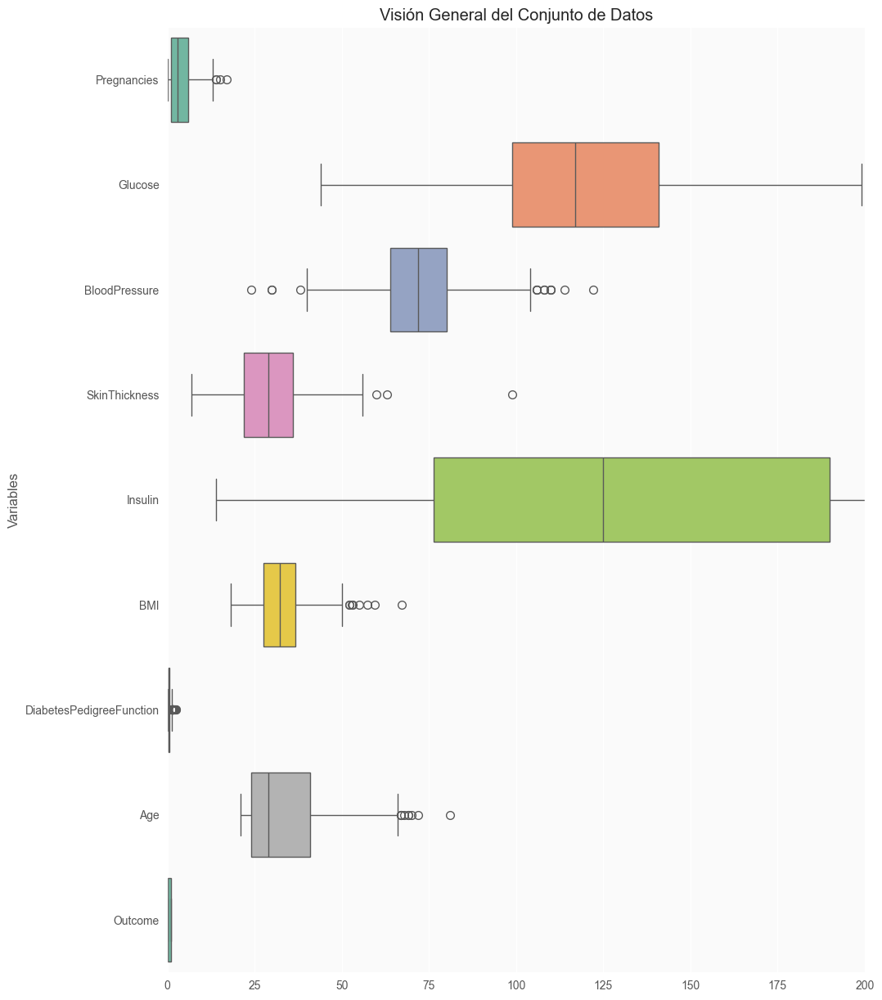

In [9]:
plt.style.use('ggplot') # Using ggplot2 style visuals 

f, ax = plt.subplots(figsize=(11, 15))

ax.set_facecolor('#fafafa')
ax.set(xlim=(-.05, 200))
plt.ylabel('Variables')
plt.title("Visión General del Conjunto de Datos")
ax = sns.boxplot(data = data, 
  orient = 'h', 
  palette = 'Set2')

Ahora si, todos los valores faltantes están codificados con el valor NaN.

**Para completar estos valores NaN, es necesario entender la distribución de los datos en relación con el objetivo.**. 

In [10]:
def correlation_plot():
    #correlation
    correlation = data.corr()
    #tick labels
    matrix_cols = correlation.columns.tolist()
    #convert to array
    corr_array  = np.array(correlation)
    trace = go.Heatmap(z = corr_array,
                       x = matrix_cols,
                       y = matrix_cols,
                       colorscale='Viridis',
                       colorbar   = dict() ,
                      )
    layout = go.Layout(dict(title = 'Correlation Matrix for variables',
                            #autosize = False,
                            #height  = 1400,
                            #width   = 1600,
                            margin  = dict(r = 0 ,l = 100,
                                           t = 0,b = 100,
                                         ),
                            yaxis   = dict(tickfont = dict(size = 9)),
                            xaxis   = dict(tickfont = dict(size = 9)),
                           )
                      )
    fig = go.Figure(data = [trace],layout = layout)
    py.iplot(fig)

Una **matriz de correlación** es una tabla que muestra los coeficientes de correlación entre conjuntos de variables. Cada variable aleatoria (Xi) en la tabla está correlacionada con cada uno de los otros valores en la tabla (Xj). Esto te permite ver qué pares tienen la correlación más alta.

In [11]:
correlation_plot()

A continuación, se puede ver la precisión de LGBM con la sustitución de los valores NaN por la media de la variable (los mismos resultados con la mediana).

Para reemplazar los valores faltantes, utilizaré la mediana por objetivo (Resultado).

# <a id='3'>3. Reemplazar valores faltantes y EDA (Análisis Exploratorio de Datos)</a> 

In [12]:
def median_target(var):   
    temp = data[data[var].notnull()]
    temp = temp[[var, 'Outcome']].groupby(['Outcome'])[[var]].median().reset_index()
    return temp

## <a id='3.1'>3.1. Insulina</a> 

* **Insulina** : Insulina sérica a las 2 horas (mu U/ml)

In [13]:
def plot_distribution(data_select, size_bin) :  
    # 2 datasets
    tmp1 = D[data_select]
    tmp2 = H[data_select]
    hist_data = [tmp1, tmp2]
    
    group_labels = ['diabetica', 'saludable']
    colors = ['#FFD700', '#7EC0EE']

    fig = ff.create_distplot(hist_data, group_labels, colors = colors, show_hist = True, bin_size = size_bin, curve_type='kde')
    
    fig['layout'].update(title = data_select)

    py.iplot(fig, filename = 'Density plot')

In [14]:
plot_distribution('Insulin', 0)

In [15]:
median_target('Insulin')

,Outcome,Insulin
0,0,102.5
1,1,169.5


¡Las medianas de insulina según el objetivo son realmente diferentes! 102.5 para una persona saludable y 169.5 para una persona diabética.

In [16]:
data.loc[(data['Outcome'] == 0 ) & (data['Insulin'].isnull()), 'Insulin'] = 102.5
data.loc[(data['Outcome'] == 1 ) & (data['Insulin'].isnull()), 'Insulin'] = 169.5

## <a id='3.2'>3.2. Glucosa</a> 

* **Glucosa** : Concentración de glucosa en plasma a las 2 horas en una prueba de tolerancia oral a la glucosa.

In [17]:
plot_distribution('Glucose', 0)

In [18]:
median_target('Glucose')

,Outcome,Glucose
0,0,107.0
1,1,140.0


In [19]:
data.loc[(data['Outcome'] == 0 ) & (data['Glucose'].isnull()), 'Glucose'] = 107
data.loc[(data['Outcome'] == 1 ) & (data['Glucose'].isnull()), 'Glucose'] = 140

107 para una persona saludable y 140 para una persona diabética.

## <a id='3.3'>3.3. Espesor de Piel</a> 

* **Espesor de Piel** : Grosor del pliegue cutáneo del tríceps (mm)

In [20]:
plot_distribution('SkinThickness', 10)

In [21]:
median_target('SkinThickness')

,Outcome,SkinThickness
0,0,27.0
1,1,32.0


In [22]:
data.loc[(data['Outcome'] == 0 ) & (data['SkinThickness'].isnull()), 'SkinThickness'] = 27
data.loc[(data['Outcome'] == 1 ) & (data['SkinThickness'].isnull()), 'SkinThickness'] = 32

27 para una persona saludable y 32 para una persona diabética.

## <a id='3.4'>3.4. Presión Arterial</a> 

* **Presión Arterial** : Presión arterial diastólica (mm Hg)

In [23]:
plot_distribution('BloodPressure', 5)

In [24]:
median_target('BloodPressure')

,Outcome,BloodPressure
0,0,70.0
1,1,74.5


In [25]:
data.loc[(data['Outcome'] == 0 ) & (data['BloodPressure'].isnull()), 'BloodPressure'] = 70
data.loc[(data['Outcome'] == 1 ) & (data['BloodPressure'].isnull()), 'BloodPressure'] = 74.5

## <a id='3.5'>3.5. IMC</a> 

* **IMC** : Índice de masa corporal (peso en kg/(altura en m)^2)

In [26]:
plot_distribution('BMI', 0)

In [27]:
median_target('BMI')

,Outcome,BMI
0,0,30.1
1,1,34.3


In [28]:
data.loc[(data['Outcome'] == 0 ) & (data['BMI'].isnull()), 'BMI'] = 30.1
data.loc[(data['Outcome'] == 1 ) & (data['BMI'].isnull()), 'BMI'] = 34.3

* **Edad** : Edad (años)
* **Función de Árbol Genealógico de Diabetes** : Función de árbol genealógico de diabetes
* **Embarazos** : Número de veces embarazada

In [29]:
#plot distribution 
plot_distribution('Age', 0)
plot_distribution('Pregnancies', 0)
plot_distribution('DiabetesPedigreeFunction', 0)

In [30]:
missing_plot(data, 'Outcome')

Todas las características están completas
Ahora, voy a crear nuevas características.

# <a id='4'>4. Nuevas características y EDA</a> 

Aquí, definimos 3 funciones de gráficos.

In [31]:
def plot_feat1_feat2(feat1, feat2) :  
    D = data[(data['Outcome'] != 0)]
    H = data[(data['Outcome'] == 0)]
    trace0 = go.Scatter(
        x = D[feat1],
        y = D[feat2],
        name = 'diabetic',
        mode = 'markers', 
        marker = dict(color = '#FFD700',
            line = dict(
                width = 1)))

    trace1 = go.Scatter(
        x = H[feat1],
        y = H[feat2],
        name = 'healthy',
        mode = 'markers',
        marker = dict(color = '#7EC0EE',
            line = dict(
                width = 1)))

    layout = dict(title = feat1 +" "+"vs"+" "+ feat2,
                  yaxis = dict(title = feat2,zeroline = False),
                  xaxis = dict(title = feat1, zeroline = False)
                 )

    plots = [trace0, trace1]

    fig = dict(data = plots, layout=layout)
    py.iplot(fig)

In [32]:
def barplot(var_select, sub) :
    tmp1 = data[(data['Outcome'] != 0)]
    tmp2 = data[(data['Outcome'] == 0)]
    tmp3 = pd.DataFrame(pd.crosstab(data[var_select],data['Outcome']), )
    tmp3['% diabetic'] = tmp3[1] / (tmp3[1] + tmp3[0]) * 100

    color=['lightskyblue','gold' ]
    trace1 = go.Bar(
        x=tmp1[var_select].value_counts().keys().tolist(),
        y=tmp1[var_select].value_counts().values.tolist(),
        text=tmp1[var_select].value_counts().values.tolist(),
        textposition = 'auto',
        name='diabetic',opacity = 0.8, marker=dict(
        color='gold',
        line=dict(color='#000000',width=1)))

    
    trace2 = go.Bar(
        x=tmp2[var_select].value_counts().keys().tolist(),
        y=tmp2[var_select].value_counts().values.tolist(),
        text=tmp2[var_select].value_counts().values.tolist(),
        textposition = 'auto',
        name='healthy', opacity = 0.8, marker=dict(
        color='lightskyblue',
        line=dict(color='#000000',width=1)))
    
    trace3 =  go.Scatter(   
        x=tmp3.index,
        y=tmp3['% diabetic'],
        yaxis = 'y2',
        name='% diabetic', opacity = 0.6, marker=dict(
        color='black',
        line=dict(color='#000000',width=0.5
        )))

    layout = dict(title =  str(var_select)+' '+(sub),
              xaxis=dict(), 
              yaxis=dict(title= 'Count'), 
              yaxis2=dict(range= [-0, 75], 
                          overlaying= 'y', 
                          anchor= 'x', 
                          side= 'right',
                          zeroline=False,
                          showgrid= False, 
                          title= '% diabetic'
                         ))

    fig = go.Figure(data=[trace1, trace2, trace3], layout=layout)
    py.iplot(fig)

In [33]:
# Define un gráfico de pastel para visualizar la repartición de cada variable frente a las modalidades del objetivo: Sobrevivió o Murió (entrenamiento).
def plot_pie(var_select, sub) :
    D = data[(data['Outcome'] != 0)]
    H = data[(data['Outcome'] == 0)]
    
    col =['Silver', 'mediumturquoise','#CF5C36','lightblue','magenta', '#FF5D73','#F2D7EE','mediumturquoise']
    
    trace1 = go.Pie(values  = D[var_select].value_counts().values.tolist(),
                    labels  = D[var_select].value_counts().keys().tolist(),
                    textfont=dict(size=15), opacity = 0.8,
                    hole = 0.5, 
                    hoverinfo = "label+percent+name",
                    domain  = dict(x = [.0,.48]),
                    name    = "Diabetic",
                    marker  = dict(colors = col, line = dict(width = 1.5)))
    trace2 = go.Pie(values  = H[var_select].value_counts().values.tolist(),
                    labels  = H[var_select].value_counts().keys().tolist(),
                    textfont=dict(size=15), opacity = 0.8,
                    hole = 0.5,
                    hoverinfo = "label+percent+name",
                    marker  = dict(line = dict(width = 1.5)),
                    domain  = dict(x = [.52,1]),
                    name    = "Healthy" )

    layout = go.Layout(dict(title = var_select + " distribution by target <br>"+(sub),
                            annotations = [ dict(text = "Diabetic"+" : "+"268",
                                                font = dict(size = 13),
                                                showarrow = False,
                                                x = .22, y = -0.1),
                                            dict(text = "Healthy"+" : "+"500",
                                                font = dict(size = 13),
                                                showarrow = False,
                                                x = .8,y = -.1)]))
                                          

    fig  = go.Figure(data = [trace1,trace2],layout = layout)
    py.iplot(fig)

* **Glucosa y Edad**

In [34]:
plot_feat1_feat2('Glucose','Age')

Las personas saludables están concentradas con una edad <= 30 y glucosa <= 120.

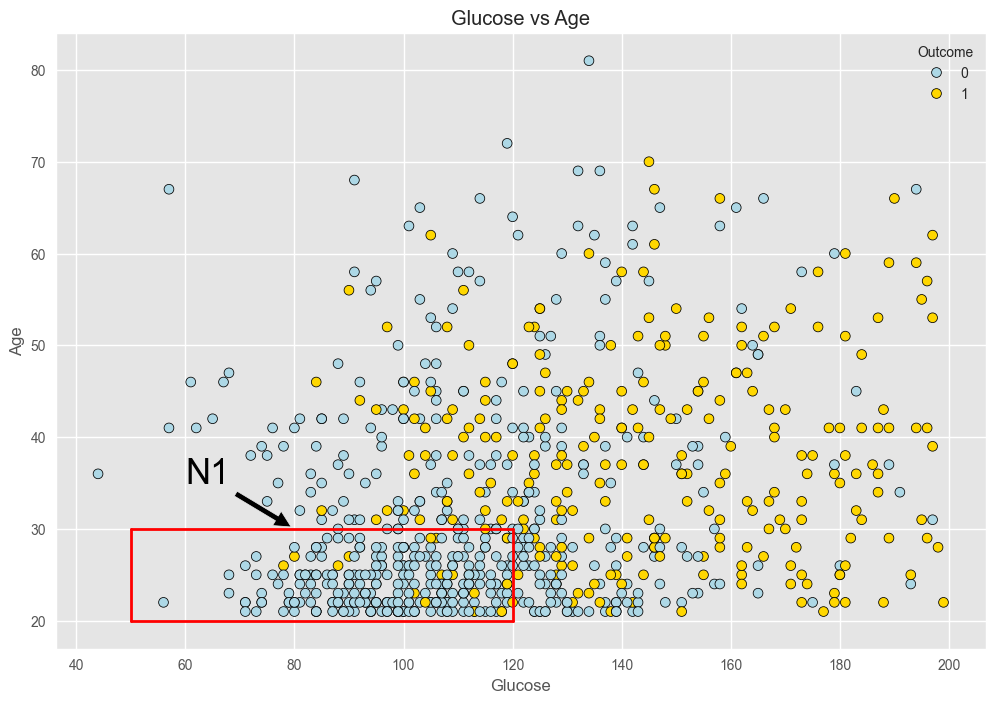

In [35]:
palette ={0 : 'lightblue', 1 : 'gold'}
edgecolor = 'black'

fig = plt.figure(figsize=(12,8))

ax1 = sns.scatterplot(x = data['Glucose'], y = data['Age'], hue = "Outcome",
                    data = data, palette = palette, edgecolor=edgecolor)

plt.annotate('N1', size=25, color='black', xy=(80, 30), xytext=(60, 35),
            arrowprops=dict(facecolor='black', shrink=0.05),
            )
plt.plot([50, 120], [30, 30], linewidth=2, color = 'red')
plt.plot([120, 120], [20, 30], linewidth=2, color = 'red')
plt.plot([50, 120], [20, 20], linewidth=2, color = 'red')
plt.plot([50, 50], [20, 30], linewidth=2, color = 'red')
plt.title('Glucose vs Age')
plt.show()

In [36]:
data.loc[:,'N1']=0
data.loc[(data['Age']<=30) & (data['Glucose']<=120),'N1']=1

In [37]:
barplot('N1', ':Glucose <= 120 and Age <= 30')

In [38]:
plot_pie('N1', '(Glucose <= 120 and Age <= 30)')

* **IMC**

Según Wikipedia, "El índice de masa corporal (IMC) o índice de Quetelet es un valor derivado de la masa (peso) y la altura de un individuo. El IMC se define como la masa corporal dividida por el cuadrado de la altura corporal, y se expresa universalmente en unidades de kg/m², resultante de la masa en kilogramos y la altura en metros."

30 kg/m² es el límite para la obesidad.

In [39]:
data.loc[:,'N2']=0
data.loc[(data['BMI']<=30),'N2']=1

In [40]:
barplot('N2', ': BMI <= 30')

In [41]:
plot_pie('N2', 'BMI <= 30')

* **Embarazos y Edad**

In [42]:
plot_feat1_feat2('Pregnancies','Age')

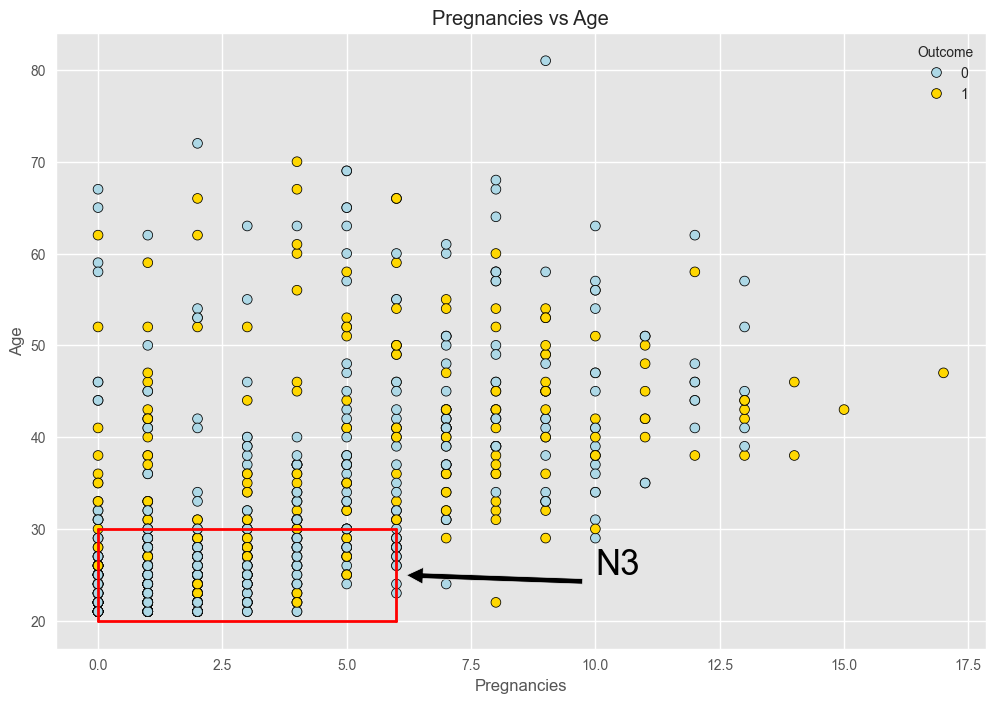

In [43]:
palette ={0 : 'lightblue', 1 : 'gold'}
edgecolor = 'black'

fig = plt.figure(figsize=(12,8))

ax1 = sns.scatterplot(x = data['Pregnancies'], y = data['Age'], hue = "Outcome",
                    data = data, palette = palette, edgecolor=edgecolor)

plt.annotate('N3', size=25, color='black', xy=(6, 25), xytext=(10, 25),
            arrowprops=dict(facecolor='black', shrink=0.05),
            )
plt.plot([0, 6], [30, 30], linewidth=2, color = 'red')
plt.plot([6, 6], [20, 30], linewidth=2, color = 'red')
plt.plot([0, 6], [20, 20], linewidth=2, color = 'red')
plt.plot([0, 0], [20, 30], linewidth=2, color = 'red')
plt.title('Pregnancies vs Age')
plt.show()

In [44]:
data.loc[:,'N3']=0
data.loc[(data['Age']<=30) & (data['Pregnancies']<=6),'N3']=1

In [45]:
barplot('N3', ': Age <= 30 and Pregnancies <= 6')

In [46]:
plot_pie('N3', 'Age <= 30 and Pregnancies <= 6')

* **Glucosa y Presión Arterial**

In [47]:
plot_feat1_feat2('Glucose','BloodPressure')

Las personas saludables están concentradas con una presión arterial <= 80 y glucosa <= 105.

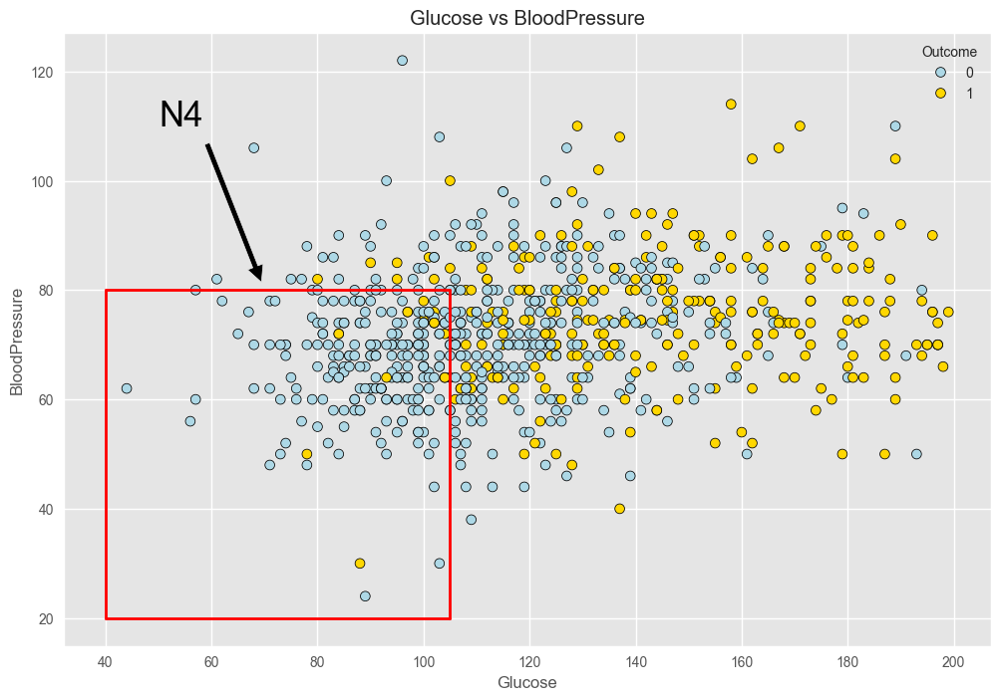

In [48]:
palette ={0 : 'lightblue', 1 : 'gold'}
edgecolor = 'black'

fig = plt.figure(figsize=(12,8))

ax1 = sns.scatterplot(x = data['Glucose'], y = data['BloodPressure'], hue = "Outcome",
                    data = data, palette = palette, edgecolor=edgecolor)

plt.annotate('N4', size=25, color='black', xy=(70, 80), xytext=(50, 110),
            arrowprops=dict(facecolor='black', shrink=0.05),
            )
plt.plot([40, 105], [80, 80], linewidth=2, color = 'red')
plt.plot([40, 40], [20, 80], linewidth=2, color = 'red')
plt.plot([40, 105], [20, 20], linewidth=2, color = 'red')
plt.plot([105, 105], [20, 80], linewidth=2, color = 'red')
plt.title('Glucose vs BloodPressure')
plt.show()

In [49]:
data.loc[:,'N4']=0
data.loc[(data['Glucose']<=105) & (data['BloodPressure']<=80),'N4']=1

In [50]:
barplot('N4', ': Glucose <= 105 and BloodPressure <= 80')

In [51]:
plot_pie('N4', 'Glucose <= 105 and BloodPressure <= 80')

* **Espesor de Piel**

In [52]:
data.loc[:,'N5']=0
data.loc[(data['SkinThickness']<=20) ,'N5']=1

In [53]:
barplot('N5', ':SkinThickness <= 20')

In [54]:
plot_pie('N5', 'SkinThickness <= 20')

* **Espesor de Piel e IMC**

In [55]:
plot_feat1_feat2('SkinThickness','BMI')

Las personas saludables están concentradas con un IMC < 30 y un espesor de piel <= 20.

In [56]:
data.loc[:,'N6']=0
data.loc[(data['BMI']<30) & (data['SkinThickness']<=20),'N6']=1

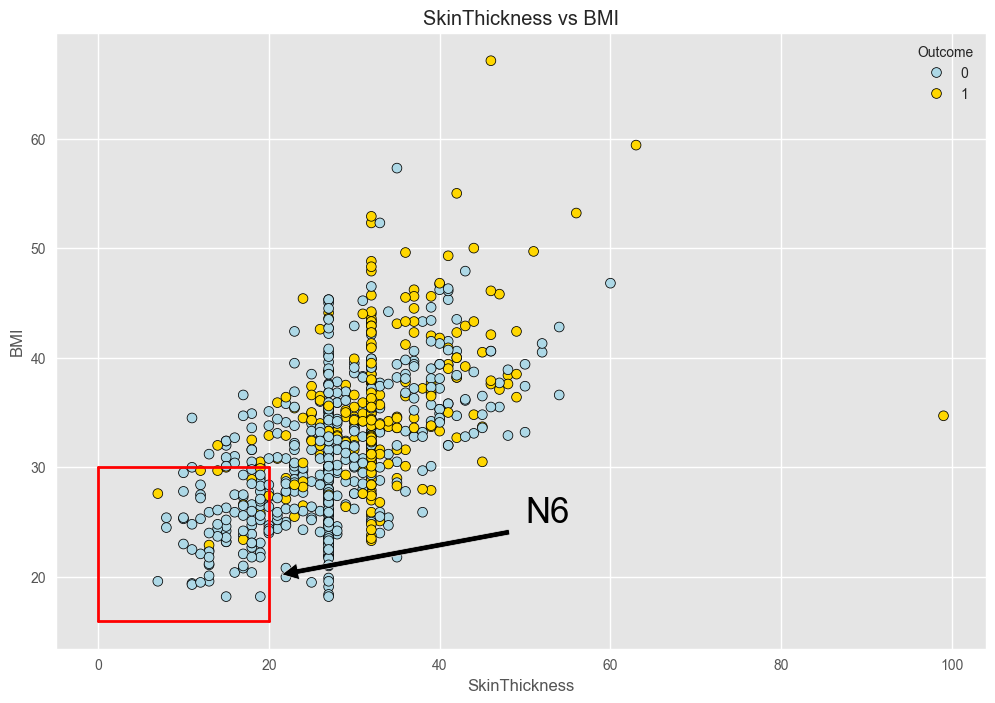

In [57]:
palette ={0 : 'lightblue', 1 : 'gold'}
edgecolor = 'black'

fig = plt.figure(figsize=(12,8))

ax1 = sns.scatterplot(x = data['SkinThickness'], y = data['BMI'], hue = "Outcome",
                    data = data, palette = palette, edgecolor=edgecolor)

plt.annotate('N6', size=25, color='black', xy=(20, 20), xytext=(50, 25),
            arrowprops=dict(facecolor='black', shrink=0.05),
            )
plt.plot([0, 20], [30, 30], linewidth=2, color = 'red')
plt.plot([0, 0], [16, 30], linewidth=2, color = 'red')
plt.plot([0, 20], [16, 16], linewidth=2, color = 'red')
plt.plot([20, 20], [16, 30], linewidth=2, color = 'red')
plt.title('SkinThickness vs BMI')
plt.show()

In [58]:
barplot('N6', ': BMI < 30 and SkinThickness <= 20')

In [59]:
plot_pie('N6', 'BMI < 30 and SkinThickness <= 20')

* **Glucosa e IMC**

In [60]:
plot_feat1_feat2('Glucose','BMI')

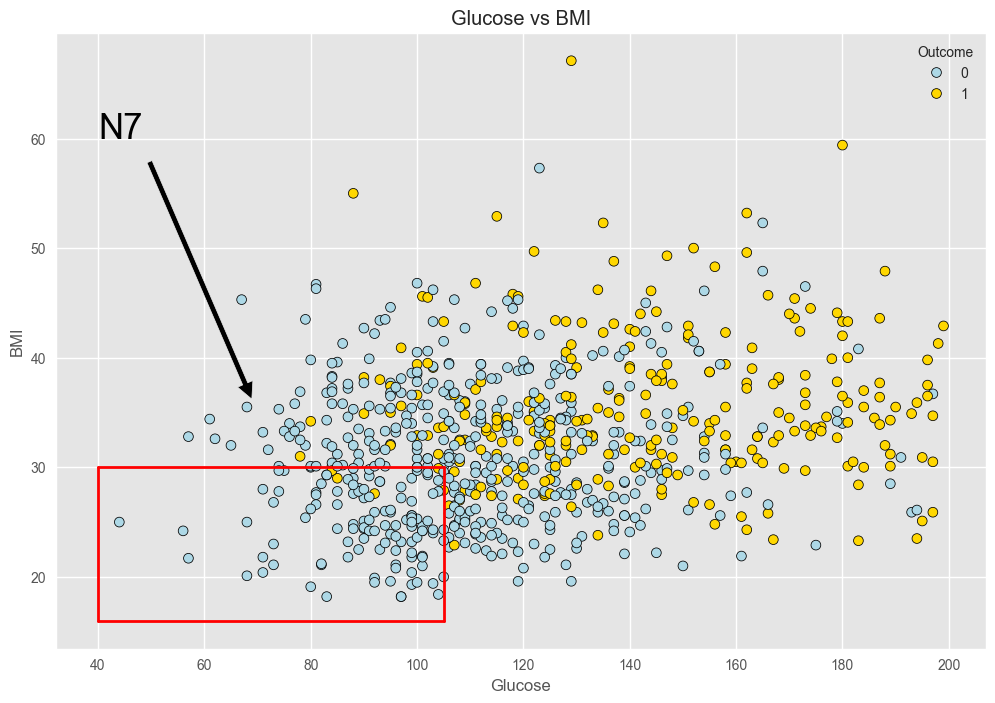

In [61]:
palette ={0 : 'lightblue', 1 : 'gold'}
edgecolor = 'black'

fig = plt.figure(figsize=(12,8))

ax1 = sns.scatterplot(x = data['Glucose'], y = data['BMI'], hue = "Outcome",
                    data = data, palette = palette, edgecolor=edgecolor)

plt.annotate('N7', size=25, color='black', xy=(70, 35), xytext=(40, 60),
            arrowprops=dict(facecolor='black', shrink=0.05),
            )
plt.plot([105, 105], [16, 30], linewidth=2, color = 'red')
plt.plot([40, 40], [16, 30], linewidth=2, color = 'red')
plt.plot([40, 105], [16, 16], linewidth=2, color = 'red')
plt.plot([40, 105], [30, 30], linewidth=2, color = 'red')
plt.title('Glucose vs BMI')
plt.show()

In [62]:
data.loc[:,'N7']=0
data.loc[(data['Glucose']<=105) & (data['BMI']<=30),'N7']=1

In [63]:
barplot('N7', ': Glucose <= 105 and BMI <= 30')

In [64]:
plot_pie('N7', 'Glucose <= 105 and BMI <= 30')

* **Insulina**

In [65]:
plot_distribution('Insulin', 0)

In [66]:
data.loc[:,'N9']=0
data.loc[(data['Insulin']<200),'N9']=1

In [67]:
barplot('N9', ': Insulin < 200')

In [68]:
plot_pie('N9', 'Insulin < 200')

* **Presión Arterial**

In [69]:
data.loc[:,'N10']=0
data.loc[(data['BloodPressure']<80),'N10']=1

In [70]:
barplot('N10', ': BloodPressure < 80')

In [71]:
plot_pie('N10', 'BloodPressure < 80')

* **Embarazos**

In [72]:
plot_distribution('Pregnancies', 0)

In [73]:
data.loc[:,'N11']=0
data.loc[(data['Pregnancies']<4) & (data['Pregnancies']!=0) ,'N11']=1

In [74]:
barplot('N11', ': Pregnancies > 0 and < 4')

In [75]:
plot_pie('N11', 'Pregnancies > 0 and < 4')

* **Otros**

In [76]:
data['N0'] = data['BMI'] * data['SkinThickness']

data['N8'] =  data['Pregnancies'] / data['Age']

data['N13'] = data['Glucose'] / data['DiabetesPedigreeFunction']

data['N12'] = data['Age'] * data['DiabetesPedigreeFunction']

data['N14'] = data['Age'] / data['Insulin']


In [77]:
D = data[(data['Outcome'] != 0)]
H = data[(data['Outcome'] == 0)]

In [78]:
plot_distribution('N0', 0)

In [79]:
data.loc[:,'N15']=0
data.loc[(data['N0']<1034) ,'N15']=1

In [80]:
barplot('N15', ': N0 < 1034')

In [81]:
plot_pie('N15', 'N0 < 1034')

# <a id='5'>5. Preparar conjunto de datos</a> 

## <a id='5.1'>5.1. StandardScaler y LabelEncoder</a> 

* **StandardScaler** :

Estandariza las características eliminando la media y escalando a varianza unitaria: 

La centralización y el escalado ocurren independientemente en cada característica al calcular las estadísticas relevantes en las muestras del conjunto. Luego, la media y la desviación estándar se almacenan para usarse en datos posteriores utilizando el método transform.

La estandarización de un conjunto de datos es un requisito común para muchos estimadores de machine learning: pueden comportarse mal si las características individuales no se parecen más o menos a datos distribuidos de manera normal estándar (por ejemplo, Gaussianos con media 0 y varianza unitaria).

* **LabelEncoder** : Codifica etiquetas con valores entre 0 y n_clases-1.

A continuación codifico los datos para alimentarlos adecuadamente a mi algoritmo.

In [82]:
target_col = ["Outcome"]
cat_cols   = data.nunique()[data.nunique() < 12].keys().tolist()
cat_cols   = [x for x in cat_cols ]
#numerical columns
num_cols   = [x for x in data.columns if x not in cat_cols + target_col]
#Binary columns with 2 values
bin_cols   = data.nunique()[data.nunique() == 2].keys().tolist()
#Columns more than 2 values
multi_cols = [i for i in cat_cols if i not in bin_cols]

#Label encoding Binary columns
le = LabelEncoder()
for i in bin_cols :
    data[i] = le.fit_transform(data[i])
    
#Duplicating columns for multi value columns
data = pd.get_dummies(data = data,columns = multi_cols )

#Scaling Numerical columns
std = StandardScaler()
scaled = std.fit_transform(data[num_cols])
scaled = pd.DataFrame(scaled,columns=num_cols)

#dropping original values merging scaled values for numerical columns
df_data_og = data.copy()
data = data.drop(columns = num_cols,axis = 1)
data = data.merge(scaled,left_index=True,right_index=True,how = "left")

Ahora, podemos calcular la matriz de correlación.

## <a id='5.2'>5.2. Matriz de Correlación</a> 

Una **matriz de correlación** es una tabla que muestra los coeficientes de correlación entre conjuntos de variables. Cada variable aleatoria (Xi) en la tabla está correlacionada con cada uno de los otros valores en la tabla (Xj). Esto te permite ver qué pares tienen la correlación más alta.

In [83]:
def correlation_plot():
    #correlation
    correlation = data.corr()
    #tick labels
    matrix_cols = correlation.columns.tolist()
    #convert to array
    corr_array  = np.array(correlation)
    trace = go.Heatmap(z = corr_array,
                       x = matrix_cols,
                       y = matrix_cols,
                       colorscale='Viridis',
                       colorbar   = dict() ,
                      )
    layout = go.Layout(dict(title = 'Correlation Matrix for variables',
                            #autosize = False,
                            #height  = 1400,
                            #width   = 1600,
                            margin  = dict(r = 0 ,l = 100,
                                           t = 0,b = 100,
                                         ),
                            yaxis   = dict(tickfont = dict(size = 9)),
                            xaxis   = dict(tickfont = dict(size = 9)),
                           )
                      )
    fig = go.Figure(data = [trace],layout = layout)
    py.iplot(fig)


In [84]:
correlation_plot()

## <a id='5.3'>5.3. X e Y</a> 

Definimos X e Y:

In [85]:
# Def X and Y
X = data.drop('Outcome', axis=1)
y = data['Outcome']

## <a id='5.4'>5.4. Desempeño del Modelo</a> 

Para medir el desempeño de un modelo, necesitamos varios elementos:

Esta parte es esencial

* **Matriz de confusión** : también conocida como la matriz de error, permite la visualización del desempeño de un algoritmo:

    * verdadero positivo (TP): Diabético correctamente identificado como diabético
    * verdadero negativo (TN): Saludable correctamente identificado como saludable
    * falso positivo (FP): Saludable incorrectamente identificado como diabético
    * falso negativo (FN): Diabético incorrectamente identificado como saludable

* **Métricas** :

    * Precisión: (TP + TN) / (TP + TN + FP + FN)
    * Precisión (Precision): TP / (TP + FP)
    * Recall: TP / (TP + FN)
    * F1 score: 2 x ((Precisión x Recall) / (Precisión + Recall))

* **Curva ROC** : La curva ROC se crea al graficar la tasa de verdaderos positivos (TPR) contra la tasa de falsos positivos (FPR) en varios niveles de umbral.

* **Curva de Precisión-Recall** :  muestra el equilibrio entre precisión y recall para diferentes umbrales.

Para entrenar y probar mi algoritmo utilizaré validación cruzada K-Fold.

En la validación cruzada k-fold, la muestra original se divide aleatoriamente en k subsamples de igual tamaño. De los k subsamples, uno se retiene como datos de validación para probar el modelo, y los k − 1 subsamples restantes se utilizan como datos de entrenamiento. El proceso de validación cruzada se repite k veces, utilizando cada uno de los k subsamples exactamente una vez como datos de validación. Los k resultados luego se pueden promediar para producir una única estimación. La ventaja de este método sobre el submuestreo aleatorio repetido es que todas las observaciones se utilizan tanto para entrenamiento como para validación, y cada observación se usa para validación exactamente una vez.

A continuación, definimos un informe estilizado con Plotly.

In [86]:
def model_performance(model, subtitle) :   
    #Kfold
    cv = KFold(n_splits=5, shuffle=True, random_state=42)
    y_real = []
    y_proba = []
    tprs = []
    aucs = []
    mean_fpr = np.linspace(0,1,100)
    i = 1
    
    for train,test in cv.split(X,y):
        model.fit(X.iloc[train], y.iloc[train])
        pred_proba = model.predict_proba(X.iloc[test])
        precision, recall, _ = precision_recall_curve(y.iloc[test], pred_proba[:,1])
        y_real.append(y.iloc[test])
        y_proba.append(pred_proba[:,1])
        fpr, tpr, t = roc_curve(y[test], pred_proba[:, 1])
        tprs.append(interp(mean_fpr, fpr, tpr))
        roc_auc = auc(fpr, tpr)
        aucs.append(roc_auc) 
    
    # Confusion matrix
    y_pred = cross_val_predict(model, X, y, cv=5)
    conf_matrix = confusion_matrix(y, y_pred)
    trace1 = go.Heatmap(z = conf_matrix  ,x = ["0 (pred)","1 (pred)"],
                        y = ["0 (true)","1 (true)"],xgap = 2, ygap = 2, 
                        colorscale = 'Viridis', showscale  = False)
    
    #Show metrics
    tp = conf_matrix[1,1]
    fn = conf_matrix[1,0]
    fp = conf_matrix[0,1]
    tn = conf_matrix[0,0]
    Accuracy  =  ((tp+tn)/(tp+tn+fp+fn))
    Precision =  (tp/(tp+fp))
    Recall    =  (tp/(tp+fn))
    F1_score  =  (2*(((tp/(tp+fp))*(tp/(tp+fn)))/((tp/(tp+fp))+(tp/(tp+fn)))))

    show_metrics = pd.DataFrame(data=[[Accuracy , Precision, Recall, F1_score]])
    show_metrics = show_metrics.T

    colors = ['gold', 'lightgreen', 'lightcoral', 'lightskyblue']
    trace2 = go.Bar(x = (show_metrics[0].values), 
                    y = ['Accuracy', 'Precision', 'Recall', 'F1_score'], text = np.round(show_metrics[0].values,4),
                    textposition = 'auto', textfont=dict(color='black'),
                    orientation = 'h', opacity = 1, marker=dict(
            color=colors,
            line=dict(color='#000000',width=1.5)))

    #Roc curve
    mean_tpr = np.mean(tprs, axis=0)
    mean_auc = auc(mean_fpr, mean_tpr)

    trace3 = go.Scatter(x=mean_fpr, y=mean_tpr,
                        name = "Roc : " ,
                        line = dict(color = ('rgb(22, 96, 167)'),width = 2), fill='tozeroy')
    trace4 = go.Scatter(x = [0,1],y = [0,1],
                        line = dict(color = ('black'),width = 1.5,
                        dash = 'dot'))
    
    #Precision - recall curve
    y_real = y
    y_proba = np.concatenate(y_proba)
    precision, recall, _ = precision_recall_curve(y_real, y_proba)

    trace5 = go.Scatter(x = recall, y = precision,
                        name = "Precision" + str(precision),
                        line = dict(color = ('lightcoral'),width = 2), fill='tozeroy')
    
    mean_auc=round(mean_auc,3)
    #Subplots
    fig = tls.make_subplots(rows=2, cols=2, print_grid=False,
                          specs=[[{}, {}], 
                                 [{}, {}]],
                          subplot_titles=('Confusion Matrix',
                                          'Metrics',
                                          'ROC curve'+" "+ '('+ str(mean_auc)+')',
                                          'Precision - Recall curve',
                                          ))
    #Trace and layout
    fig.append_trace(trace1,1,1)
    fig.append_trace(trace2,1,2)
    fig.append_trace(trace3,2,1)
    fig.append_trace(trace4,2,1)
    fig.append_trace(trace5,2,2)
    
    fig['layout'].update(showlegend = False, title = '<b>Model performance report (5 folds)</b><br>'+subtitle,
                        autosize = False, height = 830, width = 830,
                        plot_bgcolor = 'black',
                        paper_bgcolor = 'black',
                        margin = dict(b = 195), font=dict(color='white'))
    fig["layout"]["xaxis1"].update(color = 'white')
    fig["layout"]["yaxis1"].update(color = 'white')
    fig["layout"]["xaxis2"].update((dict(range=[0, 1], color = 'white')))
    fig["layout"]["yaxis2"].update(color = 'white')
    fig["layout"]["xaxis3"].update(dict(title = "false positive rate"), color = 'white')
    fig["layout"]["yaxis3"].update(dict(title = "true positive rate"),color = 'white')
    fig["layout"]["xaxis4"].update(dict(title = "recall"), range = [0,1.05],color = 'white')
    fig["layout"]["yaxis4"].update(dict(title = "precision"), range = [0,1.05],color = 'white')
    for i in fig['layout']['annotations']:
        i['font'] = titlefont=dict(color='white', size = 14)
    py.iplot(fig)

## <a id='5.5'>5.5. Tablas de Puntuaciones</a> 

Podemos completar el informe de desempeño del modelo con una tabla que contenga todos los resultados por cada fold.

In [87]:
def scores_table(model, subtitle):
    scores = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']
    res = []
    for sc in scores:
        scores = cross_val_score(model, X, y, cv = 5, scoring = sc)
        res.append(scores)
    df = pd.DataFrame(res).T
    df.loc['mean'] = df.mean()
    df.loc['std'] = df.std()
    df= df.rename(columns={0: 'accuracy', 1:'precision', 2:'recall',3:'f1',4:'roc_auc'})

    trace = go.Table(
        header=dict(values=['<b>Fold', '<b>Accuracy', '<b>Precision', '<b>Recall', '<b>F1 score', '<b>Roc auc'],
                    line = dict(color='#7D7F80'),
                    fill = dict(color='#a1c3d1'),
                    align = ['center'],
                    font = dict(size = 15)),
        cells=dict(values=[('1','2','3','4','5','mean', 'std'),
                           np.round(df['accuracy'],3),
                           np.round(df['precision'],3),
                           np.round(df['recall'],3),
                           np.round(df['f1'],3),
                           np.round(df['roc_auc'],3)],
                   line = dict(color='#7D7F80'),
                   fill = dict(color='#EDFAFF'),
                   align = ['center'], font = dict(size = 15)))

    layout = dict(width=800, height=400, title = '<b>Cross Validation - 5 folds</b><br>'+subtitle, font = dict(size = 15))
    fig = dict(data=[trace], layout=layout)

    py.iplot(fig, filename = 'styled_table')

# <a id='6'>6. Aprendizaje Automático</a> 

## <a id='6.1'>6.1. RandomSearch + LightGBM - Accuracy = 89.8%</a> 

**LightGBM** es un framework de boosting por gradientes que utiliza algoritmos de aprendizaje basados en árboles. Está diseñado para ser distribuido y eficiente con las siguientes ventajas:

* Mayor velocidad de entrenamiento y mayor eficiencia.
* Menor uso de memoria.
* Mejor precisión.
* Soporte para aprendizaje en paralelo y con GPU.
* Capaz de manejar datos a gran escala.

Para encontrar los mejores hiperparámetros, utilizaremos Búsqueda Aleatoria con Validación Cruzada (Random Search CV).

La búsqueda aleatoria es una técnica en la que se utilizan combinaciones aleatorias de los hiperparámetros para encontrar la mejor solución para el modelo construido.
Generalmente, RS es más rápida y precisa que GridSearchCV, que calcula todas las combinaciones posibles. Con Random Grid, especificamos el número de combinaciones que queremos.

* **LightGBM : Hiperparámetros** :

    * learning_rate (tasa de aprendizaje): Determina el impacto de cada árbol en el resultado final. GBM funciona comenzando con una estimación inicial que se actualiza utilizando el resultado de cada árbol. El parámetro de aprendizaje controla la magnitud de este cambio en las estimaciones.
    * n_estimators: número de árboles (o rondas).
    * num_leaves: número de hojas en un árbol completo, por defecto: 31.
    * min_child_samples: número mínimo de datos en una hoja. Puede usarse para lidiar con el sobreajuste.
    * min_child_weight: suma mínima de hessiana en una hoja.
    * subsample: selecciona aleatoriamente parte de los datos sin re-muestreo.
    * max_depth: describe la profundidad máxima del árbol. Este parámetro se utiliza para manejar el sobreajuste del modelo.
    * colsample_bytree: LightGBM seleccionará aleatoriamente parte de las características en cada iteración si colsample_bytree es menor que 1.0. Por ejemplo, si lo configuras en 0.8, LightGBM seleccionará el 80% de las características antes de entrenar cada árbol.
    * reg_alpha: regularización.
    * reg_lambda: regularización.
    
    * early_stopping_rounds (rondas de parada temprana): Este parámetro puede ayudarme a acelerar mi análisis. El modelo dejará de entrenar si una métrica de un conjunto de datos de validación no mejora en las últimas rondas especificadas de "early_stopping_round". Esto reducirá las iteraciones excesivas.

In [88]:
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from scipy.stats import randint as sp_randint
import lightgbm as lgbm
from lightgbm import early_stopping

random_state = 42

# Divide los datos en conjuntos de entrenamiento y validación
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=random_state)

# Ajusta el modelo
fit_params = {
    "eval_metric": 'auc',
    "eval_set": [(X_valid, y_valid)]
}

param_test = {
    'learning_rate': [0.01, 0.1],
    'n_estimators': [100, 200],
    'num_leaves': sp_randint(20, 50),
    'min_child_samples': sp_randint(20, 100),
    'min_child_weight': [1e-3, 1],
    'subsample': [0.6, 0.8, 1.0],
    'max_depth': [-1, 5, 10],
    'colsample_bytree': [0.6, 1.0],
    'reg_alpha': [0, 1, 5],
    'reg_lambda': [0, 1]
}

# Numero de combinaciones
n_iter = 300

# Inicializa LGBM y lanza la búsqueda.
lgbm_clf = lgbm.LGBMClassifier(random_state=random_state, n_jobs=4)
grid_search = RandomizedSearchCV(
    estimator=lgbm_clf, 
    param_distributions=param_test, 
    n_iter=n_iter,
    scoring='accuracy',
    cv=3,
    refit=True,
    random_state=random_state,
    verbose=True
)

# Realiza la búsqueda de hiperparámetros utilizando solo los datos de entrenamiento.
grid_search.fit(X_train, y_train)

opt_parameters = grid_search.best_params_

# Crea un nuevo modelo con los parámetros óptimos.
lgbm_clf_final = lgbm.LGBMClassifier(**opt_parameters)

# Ajusta el modelo e incluye la parada temprana directamente en el método fit().
lgbm_clf_final.fit(
    X_train, y_train,
    eval_set=[(X_valid, y_valid)],
    eval_metric='auc',
    callbacks=[early_stopping(stopping_rounds=100)]  # Usamos el callback para early stopping
)


Fitting 3 folds for each of 300 candidates, totalling 900 fits
[LightGBM] [Info] Number of positive: 142, number of negative: 267
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000792 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1128
[LightGBM] [Info] Number of data points in the train set: 409, number of used features: 24
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.347188 -> initscore=-0.631422
[LightGBM] [Info] Start training from score -0.631422
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM]

LGBMClassifier(colsample_bytree=0.6, max_depth=10, min_child_samples=65,
               min_child_weight=1, num_leaves=38, reg_alpha=1, reg_lambda=0)

In [89]:
model_performance(lgbm_clf, 'LightGBM')
scores_table(lgbm_clf, 'LightGBM')

[LightGBM] [Info] Number of positive: 213, number of negative: 401
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000611 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1605
[LightGBM] [Info] Number of data points in the train set: 614, number of used features: 24
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.346906 -> initscore=-0.632669
[LightGBM] [Info] Start training from score -0.632669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Info] Number of positive: 214, number of negative: 400
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1606
[LightGBM] [Info] Number of data points in the train set: 614, number of used features: 24
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.348534 -> initscore=-0.625489
[LightGBM] [Info] Start training from score -0.625489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

## <a id='6.2'>6.2. LightGBM - Umbral de Discriminación</a> 

* **Umbral de Discriminación** :
Una visualización de la precisión, el recall, el puntaje F1 y la tasa de cola con respecto al umbral de discriminación de un clasificador binario. El umbral de discriminación es la probabilidad o puntuación en la que se elige la clase positiva sobre la clase negativa.

[LightGBM] [Info] Number of positive: 240, number of negative: 451
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002534 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1754
[LightGBM] [Info] Number of data points in the train set: 691, number of used features: 24
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.347323 -> initscore=-0.630828
[LightGBM] [Info] Start training from score -0.630828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

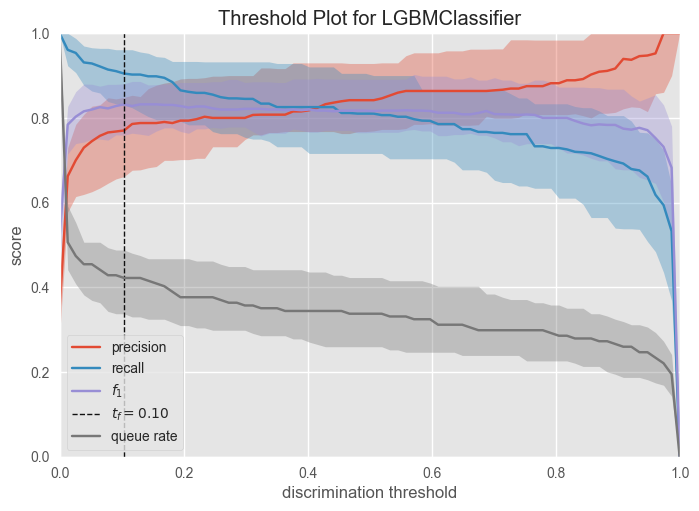

<Axes: title={'center': 'Threshold Plot for LGBMClassifier'}, xlabel='discrimination threshold', ylabel='score'>

In [90]:
visualizer = DiscriminationThreshold(lgbm_clf)

visualizer.fit(X, y)  
visualizer.poof() 

## <a id='6.3'>6.3. GridSearch + LightGBM & KNN- Accuracy = 90.6%</a> 

Obtenemos un resultado realmente bueno, pero podemos superar el 90% añadiendo un KNeighborsClassifier a LightGBM (Voting Classifier).

* **KNeighborsClassifier** : KNeighborsClassifier implementa el aprendizaje basado en los k vecinos más cercanos de cada punto de consulta, donde k es un valor entero especificado por el usuario.

* **VotingClassifier** : VotingClassifier es un meta-clasificador para combinar clasificadores de machine learning similares o conceptualmente diferentes para la clasificación mediante votación mayoritaria o pluralidad.

Con GridSearch CV buscamos el mejor "n_neighbors" para optimizar la precisión del Voting Classifier.

In [91]:
knn_clf = KNeighborsClassifier()

voting_clf = VotingClassifier(estimators=[ 
    ('lgbm_clf', lgbm_clf),
    ('knn', KNeighborsClassifier())], voting='soft', weights = [1,1])

params = {
      'knn__n_neighbors': np.arange(1,30)
      }
      
grid = GridSearchCV(estimator=voting_clf, param_grid=params, cv=5)

grid.fit(X,y)

print("Best Score:" + str(grid.best_score_))
print("Best Parameters: " + str(grid.best_params_))

[LightGBM] [Info] Number of positive: 214, number of negative: 400
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1606
[LightGBM] [Info] Number of data points in the train set: 614, number of used features: 24
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.348534 -> initscore=-0.625489
[LightGBM] [Info] Start training from score -0.625489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

Con n_neighbors = 25, la precisión aumenta al 90.625% A continuación, se muestra el informe de desempeño del modelo.

In [92]:
knn_clf = KNeighborsClassifier(n_neighbors = 25)

voting_clf = VotingClassifier (
        estimators = [('knn', knn_clf), ('lgbm', lgbm_clf)],
                     voting='soft', weights = [1,1])

In [93]:
model_performance(voting_clf, 'LightGBM & KNN')
scores_table(voting_clf, 'LightGBM & KNN')

[LightGBM] [Info] Number of positive: 213, number of negative: 401
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1605
[LightGBM] [Info] Number of data points in the train set: 614, number of used features: 24
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.346906 -> initscore=-0.632669
[LightGBM] [Info] Start training from score -0.632669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

[LightGBM] [Info] Number of positive: 214, number of negative: 400
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1606
[LightGBM] [Info] Number of data points in the train set: 614, number of used features: 24
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.348534 -> initscore=-0.625489
[LightGBM] [Info] Start training from score -0.625489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

## <a id='6.4'>6.4. LightGBM & KNN  - Discrimination Threshold</a> 

[LightGBM] [Info] Number of positive: 236, number of negative: 455
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000690 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1753
[LightGBM] [Info] Number of data points in the train set: 691, number of used features: 24
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.341534 -> initscore=-0.656466
[LightGBM] [Info] Start training from score -0.656466
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

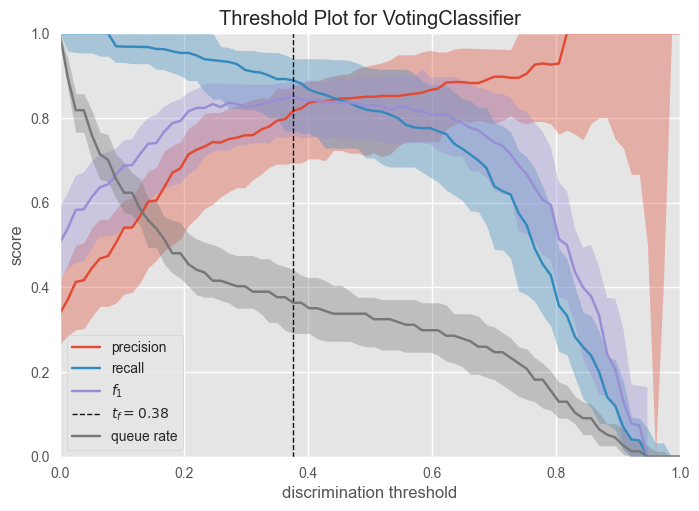

<Axes: title={'center': 'Threshold Plot for VotingClassifier'}, xlabel='discrimination threshold', ylabel='score'>

In [94]:
visualizer = DiscriminationThreshold(voting_clf)

visualizer.fit(X, y)  
visualizer.poof()  